In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import math
import seaborn as sns
import sklearn
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn import preprocessing
%matplotlib inline
sns.set_style('white')
pd.options.display.float_format = '{:.3f}'.format

from sklearn import ensemble
from sklearn import datasets
from sklearn.utils import shuffle
from sklearn.metrics import mean_squared_error

# Final Capstone
## Predicting Taxi Fares in New York City
   My final capstone will work to predict taxi fare prices throughout New York City using data that includes GPS coordinates from pickup and dropoff locations, fare prices of each ride, and the number of riders of each ride. This would be useful for taxi fare companies who seek to stay competitive with rideshare companies like Uber and Lyft. Examination of the data will allow for insight into the time of day where taxi cabs are most used allowing for the deploying of the optimal amount of taxi drivers. Popular drop off/pick up points could be examined to provide more space at heavily trafficked drop off zones.

The data was obtained using the NYC Taxi Data API. The dataset is rather large with over 55 million rows of data. The dataset contains rides between 2009 and 2015. Sample data by a percentage 

Figure out congestion time split dummy variables
12-4
4-8
8-12
12-4
8-12

Possible research Questions

- What kind of information can we obtain from clustering?
- What machine learning technique is best 

In [2]:
#taxi_test_data = pd.read_csv(r'C:\\Users\\david\Final Capstone\\NYC Taxi Data\\test.csv')
taxi_train_data = pd.read_csv(r'C:\\Users\\david\Final Capstone\\NYC Taxi Data\\train.csv', nrows = 2_750_000)

#using 5% of the data
#C:\Users\david\Final Capstone\NYC Taxi Data

In [3]:
#X_train, X_test = train_test_split(taxi_train_data, test_size=0.4, random_state=0)

In [4]:
#taxi_test_data.dtypes

In [5]:
null_count = taxi_train_data.isnull().sum()
null_count[null_count>0]

dropoff_longitude    22
dropoff_latitude     22
dtype: int64

In [6]:
taxi_train_data = taxi_train_data.dropna(how ='any', axis = 'rows')

In [7]:
taxi_train_data = taxi_train_data.drop(['key','passenger_count'], axis=1)

In [8]:
taxi_train_data.shape

(2749978, 6)

In [9]:
taxi_train_data.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude
count,2749978.000,2749978.000,2749978.000,2749978.000,2749978.000
mean,11.340,-72.517,39.926,-72.517,39.921
std,9.828,13.153,8.513,12.808,10.155
min,-62.000,-3426.609,-3488.080,-3408.430,-3488.080
25%,6.000,-73.992,40.735,-73.991,40.734
50%,8.500,-73.982,40.753,-73.980,40.753
75%,12.500,-73.967,40.767,-73.964,40.768
max,1273.310,3439.426,2912.465,3414.307,3345.917


It looks like there are some extreme outliers in the case of latitude and longitude. Let's bound everything so it includes datapoints that are within New York City. The min is about -74 for longitude and about 41 for latitude. Let's create a function that adds 5 degrees. 

https://www.mapdevelopers.com/geocode_bounding_box.php

In [10]:
-74.5, -72.8, 40.5, 41.8

def clean_df(taxi_train_data):
    return taxi_train_data[(taxi_train_data.pickup_longitude > -74.259090) & (taxi_train_data.pickup_longitude < -73.70072) &
        (taxi_train_data.pickup_latitude > 40.477399 ) & (taxi_train_data.pickup_latitude < 40.917577) &
        (taxi_train_data.dropoff_longitude > -74.259090) & (taxi_train_data.dropoff_longitude < -73.70072) &
        (taxi_train_data.dropoff_latitude > 40.477399 ) & (taxi_train_data.dropoff_latitude < 40.917577)] 

taxi_train_data = clean_df(taxi_train_data)
print(len(taxi_train_data))

2688786


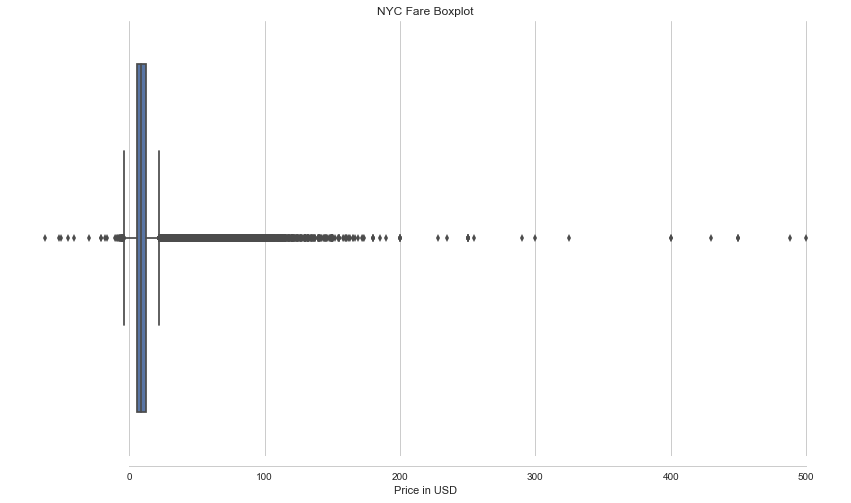

In [11]:
plt.figure(figsize=(15, 8))
sns.set(style="whitegrid")

ax = sns.boxplot(x=taxi_train_data['fare_amount'])  

plt.title('NYC Fare Boxplot')

sns.despine(offset=10, trim=True)
ax.set(xlabel='Price in USD', ylabel='')

plt.show()

The fare data also has some extreme outliers with the max being a little over $ 1,200. Also, it seems that there were some negative fares where people were paid to ride in the taxis? Let's remove those and bound it to $ 2.50 and $ 100. $ 2.50 is the minimum cab fare in NYC

In [12]:
#fix the outliers
taxi_train_data = taxi_train_data[taxi_train_data['fare_amount'].between(left = 2.5, right = 100)]

In [13]:
taxi_train_data.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude
count,2688143.000,2688143.000,2688143.000,2688143.000,2688143.000
mean,11.260,-73.976,40.751,-73.975,40.751
std,9.309,0.034,0.027,0.034,0.031
min,2.500,-74.259,40.483,-74.259,40.478
25%,6.000,-73.992,40.737,-73.992,40.736
50%,8.500,-73.982,40.753,-73.981,40.754
75%,12.500,-73.968,40.767,-73.965,40.768
max,100.000,-73.701,40.917,-73.701,40.918


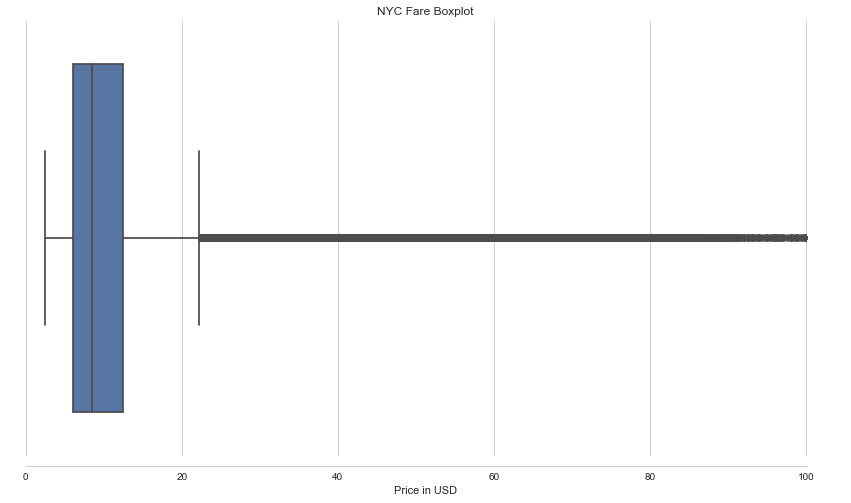

In [14]:
plt.figure(figsize=(15, 8))
sns.set(style="whitegrid")

ax = sns.boxplot(x=taxi_train_data['fare_amount'])  

plt.title('NYC Fare Boxplot')

sns.despine(offset=10, trim=True)
ax.set(xlabel='Price in USD', ylabel='')

plt.show()

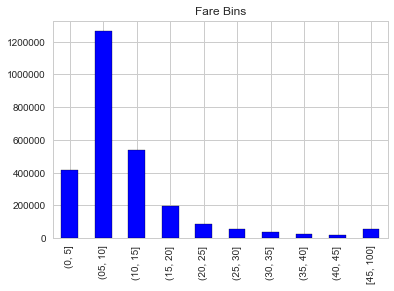

In [15]:
# Bin the fare and convert to string
taxi_train_data['fare-bin'] = pd.cut(taxi_train_data['fare_amount'], bins = list(range(0, 50, 5))).astype(str)

# Uppermost bin
taxi_train_data.loc[taxi_train_data['fare-bin'] == 'nan', 'fare-bin'] = '[45, 100]'

# Adjust bin so the sorting is correct
taxi_train_data.loc[taxi_train_data['fare-bin'] == '(5, 10]', 'fare-bin'] = '(05, 10]'

# Bar plot of value counts
taxi_train_data['fare-bin'].value_counts().sort_index().plot.bar(color = 'b', edgecolor = 'k');
plt.title('Fare Bins');

In [16]:
taxi_train_data = taxi_train_data.drop(['fare-bin'], axis=1)

In [17]:
taxi_train_data.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude
count,2688143.000,2688143.000,2688143.000,2688143.000,2688143.000
mean,11.260,-73.976,40.751,-73.975,40.751
std,9.309,0.034,0.027,0.034,0.031
min,2.500,-74.259,40.483,-74.259,40.478
25%,6.000,-73.992,40.737,-73.992,40.736
50%,8.500,-73.982,40.753,-73.981,40.754
75%,12.500,-73.968,40.767,-73.965,40.768
max,100.000,-73.701,40.917,-73.701,40.918


## Feature Engineering
#### Time and Date Features
Creating columns for:
- Year
- Month
- Day
- Hour
- Day of the Week

#### Distance Feature
Distance:
- Distance from pickup and dropoff locations

In [18]:
"""def morning_rush (row):
    if (row['hour'] <= 9) and (row['hour'] >= 6) and (row['weekday'] < 5):
        return 1
    else:
        return 0"""
"""
def mid_day (row):
    if (row['hour'] <= 15) and (row['hour'] >= 10):
        return 1
    else:
        return 0 
    
def late_night (row):
    if (row['hour'] <= 5) or (row['hour'] >= 20):
        return 1
    else:
        return 0    
    
    
def night_rush (row):
    if ((row['hour'] <= 20) and (row['hour'] >= 15)) and (row['weekday'] < 5):
        return 1
    else:
        return 0"""

def add_time_features(taxi_train_data):
    taxi_train_data['pickup_datetime'] =  pd.to_datetime(taxi_train_data['pickup_datetime'], format='%Y-%m-%d %H:%M:%S %Z')
    taxi_train_data['year'] = taxi_train_data['pickup_datetime'].apply(lambda x: x.year)
    taxi_train_data['month'] = taxi_train_data['pickup_datetime'].apply(lambda x: x.month)
    taxi_train_data['day'] = taxi_train_data['pickup_datetime'].apply(lambda x: x.day)
    taxi_train_data['hour'] = taxi_train_data['pickup_datetime'].apply(lambda x: x.hour)
    taxi_train_data['weekday'] = taxi_train_data['pickup_datetime'].apply(lambda x: x.weekday())
    #taxi_train_data['pickup_datetime'] =  taxi_train_data['pickup_datetime'].apply(lambda x: str(x))

    taxi_train_data = taxi_train_data.drop('pickup_datetime', axis=1)
    
    return taxi_train_data

def add_coordinate_features(taxi_train_data):
    lat1 = taxi_train_data['pickup_latitude']
    lat2 = taxi_train_data['dropoff_latitude']
    lon1 = taxi_train_data['pickup_longitude']
    lon2 = taxi_train_data['dropoff_longitude']
    
    # Add new features
    taxi_train_data['latdiff'] = (lat1 - lat2)
    taxi_train_data['londiff'] = (lon1 - lon2)

    return taxi_train_data


def add_distances_features(taxi_train_data):

    lat1 = taxi_train_data['pickup_latitude']
    lat2 = taxi_train_data['dropoff_latitude']
    lon1 = taxi_train_data['pickup_longitude']
    lon2 = taxi_train_data['dropoff_longitude']
    
    taxi_train_data['distance_traveled'] = (taxi_train_data['latdiff'] ** 2 + taxi_train_data['londiff'] ** 2) ** 0.5
    
    return taxi_train_data


In [19]:

taxi_train_data = add_time_features(taxi_train_data)
#taxi_train_data = add_time_features(taxi_train_data)

add_coordinate_features(taxi_train_data)
#add_coordinate_features(taxi_train_data)

taxi_train_data = add_distances_features(taxi_train_data)
#taxi_train_data = add_distances_features(taxi_train_data)

taxi_train_data.head(5)

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,year,month,day,hour,weekday,latdiff,londiff,distance_traveled
0,4.500,-73.844,40.721,-73.842,40.712,2009,6,15,17,0,0.009,-0.003,0.009
1,16.900,-74.016,40.711,-73.979,40.782,2010,1,5,16,1,-0.071,-0.037,0.080
2,5.700,-73.983,40.761,-73.991,40.751,2011,8,18,0,3,0.011,0.009,0.014
3,7.700,-73.987,40.733,-73.992,40.758,2012,4,21,4,5,-0.025,0.004,0.025
4,5.300,-73.968,40.768,-73.957,40.784,2010,3,9,7,1,-0.016,-0.011,0.019


In [20]:
taxi_train_data.head()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,year,month,day,hour,weekday,latdiff,londiff,distance_traveled
0,4.500,-73.844,40.721,-73.842,40.712,2009,6,15,17,0,0.009,-0.003,0.009
1,16.900,-74.016,40.711,-73.979,40.782,2010,1,5,16,1,-0.071,-0.037,0.080
2,5.700,-73.983,40.761,-73.991,40.751,2011,8,18,0,3,0.011,0.009,0.014
3,7.700,-73.987,40.733,-73.992,40.758,2012,4,21,4,5,-0.025,0.004,0.025
4,5.300,-73.968,40.768,-73.957,40.784,2010,3,9,7,1,-0.016,-0.011,0.019


## Taxi Cab Ride Frequency by hour

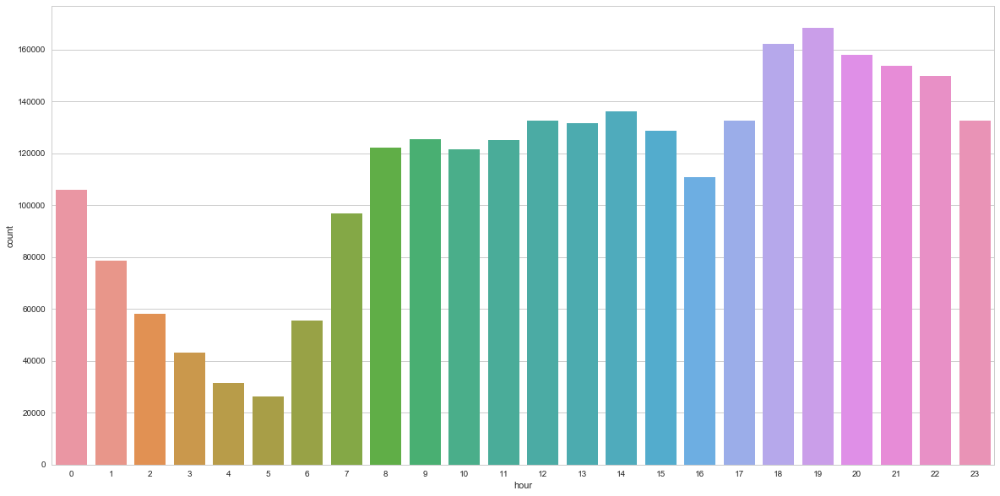

In [21]:
plt.figure(figsize=(20, 10))
n_freq=taxi_train_data['hour'].value_counts()
n_freq

n_df = pd.DataFrame({'hour':n_freq.index ,'count':n_freq.values})
n_df

sns.barplot(x='hour', y='count', data=n_df, label = "medium")


## Taxi Cab Ride Frequency by Month

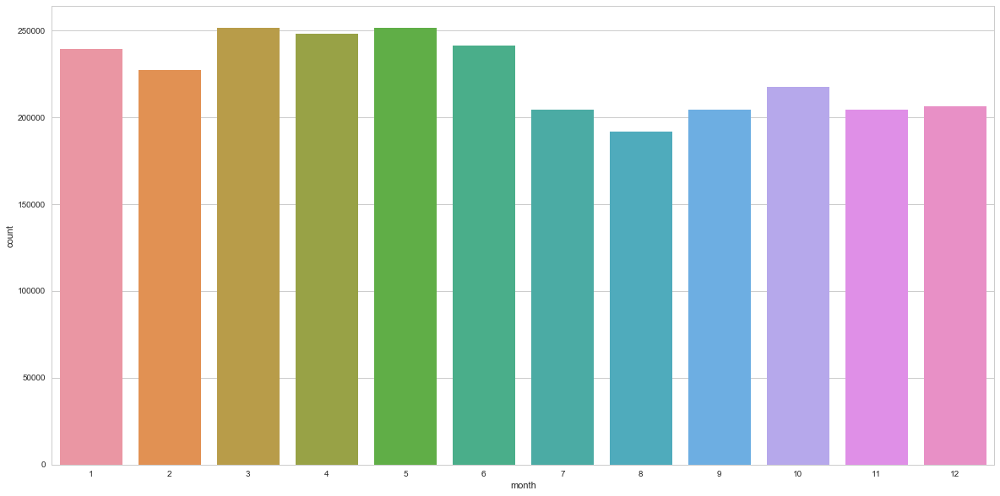

In [22]:
plt.figure(figsize=(20, 10))
n_freq=taxi_train_data['month'].value_counts()
n_freq

n_month = pd.DataFrame({'month':n_freq.index ,'count':n_freq.values})
n_month

sns.barplot(x='month', y='count', data=n_month, label= "medium")


## Taxi Cab Ride Frequency by Day of Week

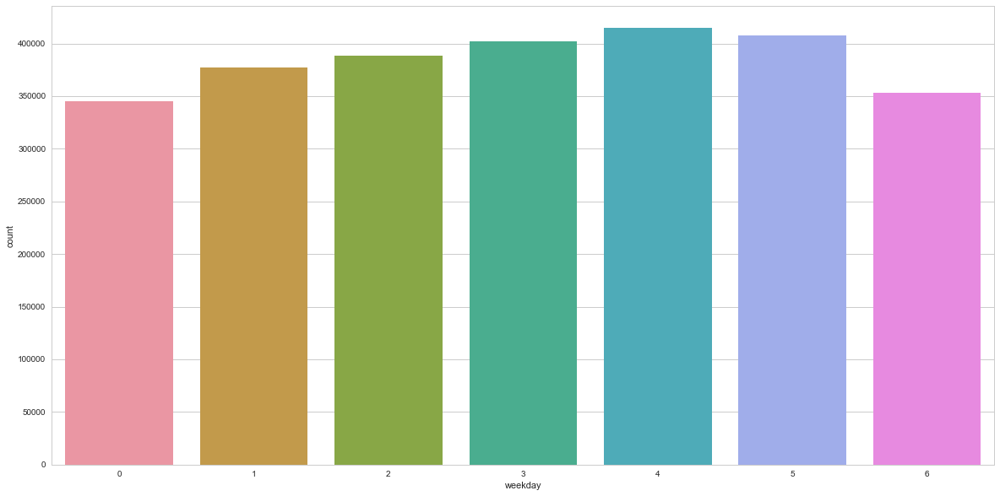

In [23]:
plt.figure(figsize=(20, 10))
n_freq=taxi_train_data['weekday'].value_counts()
n_freq

n_weekday = pd.DataFrame({'weekday':n_freq.index ,'count':n_freq.values})
n_weekday

sns.barplot(x='weekday', y='count', data=n_weekday, label = "medium")


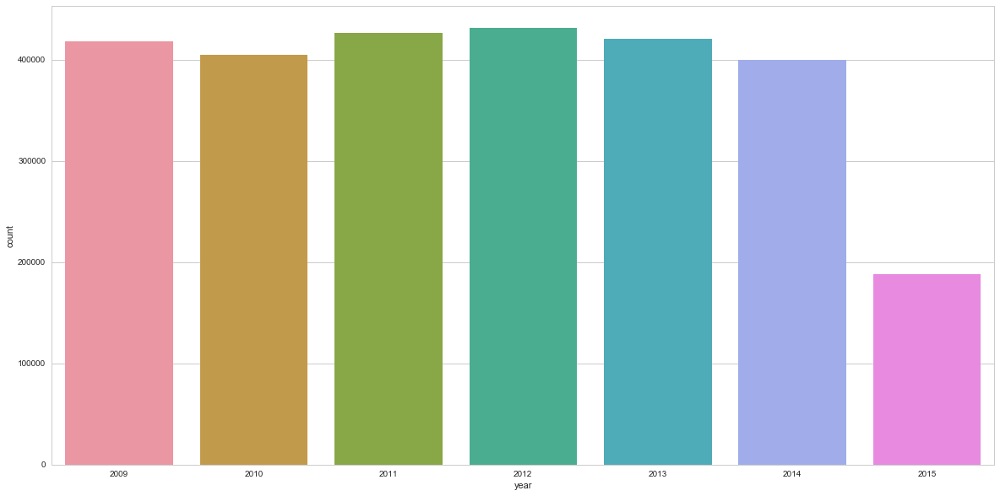

In [24]:
plt.figure(figsize=(20, 10))
n_freq=taxi_train_data['year'].value_counts()
n_freq

n_year = pd.DataFrame({'year':n_freq.index ,'count':n_freq.values})
n_year

sns.barplot(x='year', y='count', data=n_year, label= "medium")


In [25]:
# this function will also be used with the test set below
def select_within_boundingbox(df, BB):
    return (taxi_train_data.pickup_longitude >= BB[0]) & (taxi_train_data.pickup_longitude <= BB[1]) & \
           (taxi_train_data.pickup_latitude >= BB[2]) & (taxi_train_data.pickup_latitude <= BB[3]) & \
           (taxi_train_data.dropoff_longitude >= BB[0]) & (taxi_train_data.dropoff_longitude <= BB[1]) & \
           (taxi_train_data.dropoff_latitude >= BB[2]) & (taxi_train_data.dropoff_latitude <= BB[3])
            
# load image of NYC map
BB = (-74.5, -72.8, 40.5, 41.8)
nyc_map = plt.imread('https://aiblog.nl/download/nyc_-74.5_-72.8_40.5_41.8.png')

# load extra image to zoom in on NYC
BB_zoom = (-74.3, -73.7, 40.5, 40.9)
nyc_map_zoom = plt.imread('https://aiblog.nl/download/nyc_-74.3_-73.7_40.5_40.9.png')

In [26]:
# this function will be used more often to plot data on the NYC map
def plot_on_map(df, BB, nyc_map, s=10, alpha=0.2):
    fig, axs = plt.subplots(1, 2, figsize=(16,10))
    axs[0].scatter(taxi_train_data.pickup_longitude, taxi_train_data.pickup_latitude, zorder=1, alpha=alpha, c='y', s=s)
    axs[0].set_xlim((BB[0], BB[1]))
    axs[0].set_ylim((BB[2], BB[3]))
    axs[0].set_title('Pickup locations')
    axs[0].imshow(nyc_map, zorder=0, extent=BB)

    axs[1].scatter(taxi_train_data.dropoff_longitude, taxi_train_data.dropoff_latitude, zorder=1, alpha=alpha, c='r', s=s)
    axs[1].set_xlim((BB[0], BB[1]))
    axs[1].set_ylim((BB[2], BB[3]))
    axs[1].set_title('Dropoff locations')
    axs[1].imshow(nyc_map, zorder=0, extent=BB)

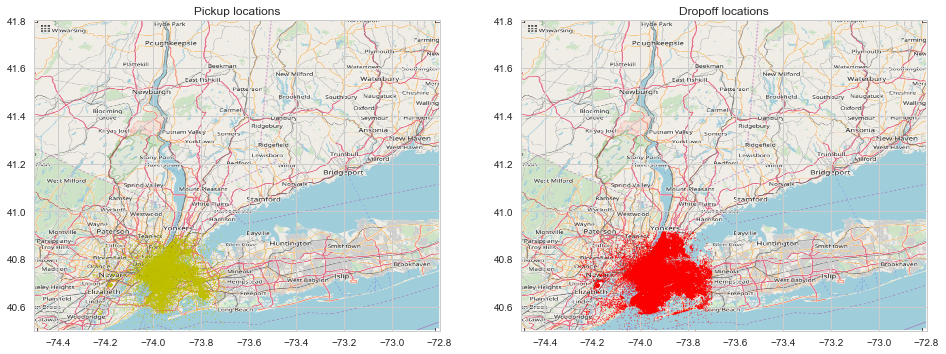

In [27]:
plot_on_map(taxi_train_data, BB, nyc_map, s=1, alpha=0.3)

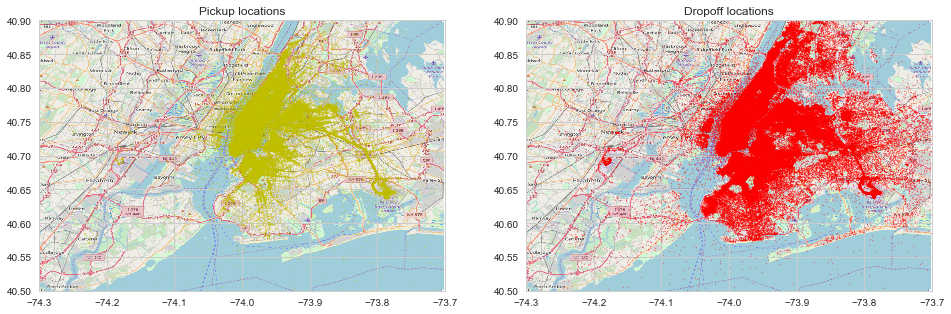

In [28]:
# plot training data on map zoomed in
plot_on_map(taxi_train_data, BB_zoom, nyc_map_zoom, s=1, alpha=0.3)

In [29]:
def plot_hires(taxi_train_data, BB, figsize=(12, 12), ax=None, c=('r', 'b')):
    if ax == None:
        fig, ax = plt.subplots(1, 1, figsize=figsize)

    idx = select_within_boundingbox(taxi_train_data, BB)
    ax.scatter(taxi_train_data[idx].pickup_longitude, taxi_train_data[idx].pickup_latitude, c=c[0], s=0.01, alpha=0.5)
    ax.scatter(taxi_train_data[idx].dropoff_longitude, taxi_train_data[idx].dropoff_latitude, c=c[1], s=0.01, alpha=0.5)

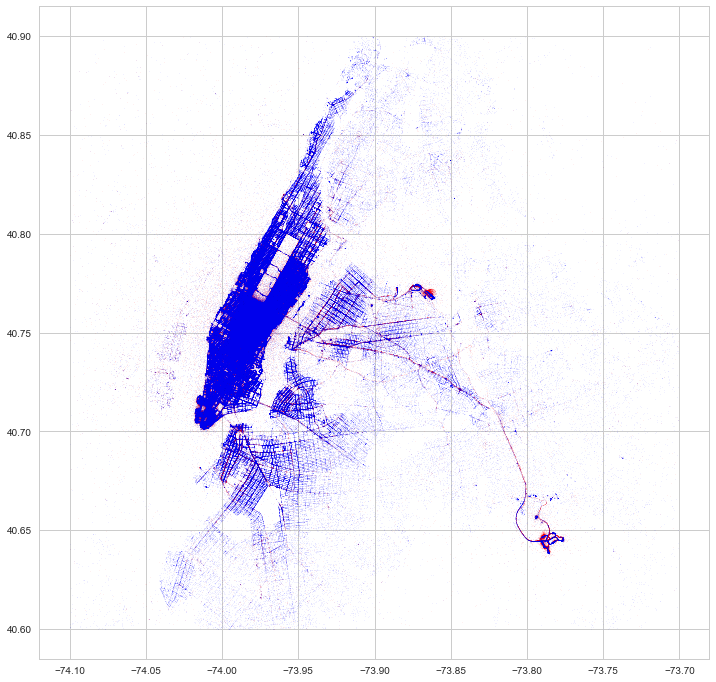

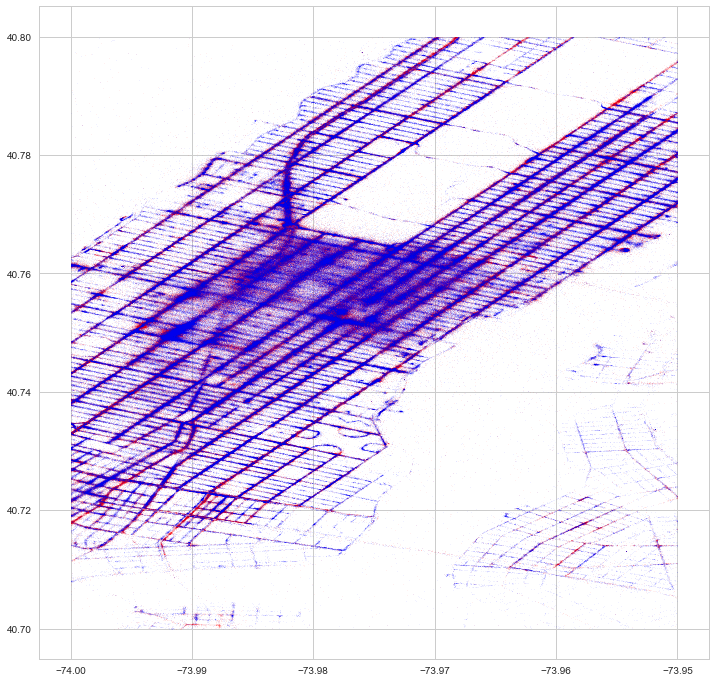

In [30]:
plot_hires(taxi_train_data, (-74.1, -73.7, 40.6, 40.9))
plot_hires(taxi_train_data, (-74, -73.95, 40.7, 40.8))

In [31]:
import folium

lat_center_jfk = 40.645626
lon_center_jfk = -73.785220

map_jfk_pk = folium.Map(location=[lat_center_jfk,lon_center_jfk],
                         tiles="OpenStreetMap",
                         max_zoom=15,zoom_start=15)

folium.Marker(location = [lat_center_jfk,lon_center_jfk],
              icon = folium.Icon( icon="star",color = "blue")).add_to(map_jfk_pk)

#plotting 2500 dta points
for i in range(0,len(taxi_train_data[:10000])) :
    p = [taxi_train_data["pickup_latitude"][:10000].values[i],
        taxi_train_data["pickup_longitude"][:10000].values[i]]
    
    folium.Circle(location = p ,radius = 2,
                  color = "red").add_to(map_jfk_pk)
    

map_jfk_pk

In [32]:
"""dayOfWeek={0:'Monday', 1:'Tuesday', 2:'Wednesday', 3:'Thursday', 4:'Friday', 5:'Saturday', 6:'Sunday'}
taxi_train_data['weekday'] = taxi_train_data['weekday'].map(dayOfWeek)"""

"dayOfWeek={0:'Monday', 1:'Tuesday', 2:'Wednesday', 3:'Thursday', 4:'Friday', 5:'Saturday', 6:'Sunday'}\ntaxi_train_data['weekday'] = taxi_train_data['weekday'].map(dayOfWeek)"

In [33]:
"""taxi_train_data = taxi_train_data.join(pd.get_dummies(taxi_train_data['hour']))"""

"taxi_train_data = taxi_train_data.join(pd.get_dummies(taxi_train_data['hour']))"

In [34]:
"""taxi_train_data = taxi_train_data.join(pd.get_dummies(taxi_train_data['weekday']))"""

"taxi_train_data = taxi_train_data.join(pd.get_dummies(taxi_train_data['weekday']))"

In [35]:
"""taxi_train_data = taxi_train_data.drop( 'weekday', axis=1)"""

"taxi_train_data = taxi_train_data.drop( 'weekday', axis=1)"

In [36]:
taxi_train_data.head()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,year,month,day,hour,weekday,latdiff,londiff,distance_traveled
0,4.500,-73.844,40.721,-73.842,40.712,2009,6,15,17,0,0.009,-0.003,0.009
1,16.900,-74.016,40.711,-73.979,40.782,2010,1,5,16,1,-0.071,-0.037,0.080
2,5.700,-73.983,40.761,-73.991,40.751,2011,8,18,0,3,0.011,0.009,0.014
3,7.700,-73.987,40.733,-73.992,40.758,2012,4,21,4,5,-0.025,0.004,0.025
4,5.300,-73.968,40.768,-73.957,40.784,2010,3,9,7,1,-0.016,-0.011,0.019


In [37]:
taxi_train_data.columns

Index(['fare_amount', 'pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'year', 'month', 'day', 'hour',
       'weekday', 'latdiff', 'londiff', 'distance_traveled'],
      dtype='object')

In [38]:
"""taxi_train_data = taxi_train_data.drop( ['month','day','year', 'hour', 'latdiff','londiff'], axis=1)"""

"taxi_train_data = taxi_train_data.drop( ['month','day','year', 'hour', 'latdiff','londiff'], axis=1)"

In [39]:
taxi_train_data = taxi_train_data.drop( ['year', 'day', 'latdiff','londiff', 'month'], axis=1)

In [40]:
taxi_train_data.head(5)

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,hour,weekday,distance_traveled
0,4.500,-73.844,40.721,-73.842,40.712,17,0,0.009
1,16.900,-74.016,40.711,-73.979,40.782,16,1,0.080
2,5.700,-73.983,40.761,-73.991,40.751,0,3,0.014
3,7.700,-73.987,40.733,-73.992,40.758,4,5,0.025
4,5.300,-73.968,40.768,-73.957,40.784,7,1,0.019


In [41]:
#random.seed()

#import random

#random.seed(n)

In [42]:
from sklearn.preprocessing import normalize
from sklearn import metrics
from sklearn.metrics import pairwise_distances
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler



# Normalize the data.
"""X_norm = normalize(X)"""
X_cluster = taxi_train_data.copy()

mms = MinMaxScaler()
mms.fit(X_cluster)
data_transformed = mms.transform(X_cluster)

# Split the data into four equally-sized samples. First we break it in half:
"""X_half1, X_half2 = train_test_split(
    X_norm,
    test_size=0.5,
    random_state=None)
X1, X2 = train_test_split(
    X_half1,
    test_size=0.5,
    random_state=None)
X3, X4  = train_test_split(
    X_half2,
    test_size=0.5,
    random_state=None)"""

# Split the data into four equally-sized samples. First we break it in half:
X_half1, X_half2 = train_test_split(
    data_transformed,
    test_size=0.5,
    random_state=42)
X1, X2 = train_test_split(
    X_half1,
    test_size=0.5,
    random_state=42)
X3, X4  = train_test_split(
    X_half2,
    test_size=0.5,
    random_state=42)


In [43]:
from sklearn.cluster import MiniBatchKMeans
from sklearn.cluster import KMeans

Sum_of_squared_distances = []
K = range(1,12)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(data_transformed)
    Sum_of_squared_distances.append(km.inertia_)

7 Clusters. Investigated silhouette score was .30

2 clusters. silhouette score was 


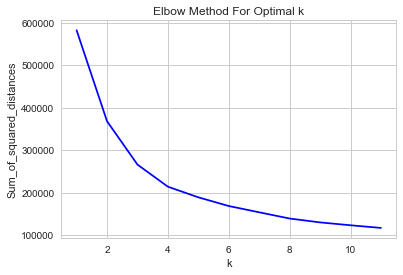

In [44]:
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [45]:
from sklearn.cluster import MiniBatchKMeans
from sklearn.cluster import KMeans
n_clusters = (2,3,4,5,6,7,8)
for n in n_clusters:
    print("Number of estimated clusters: {}".format(n))
    for sample in [data_transformed]:
        model = KMeans(n_clusters=n, random_state=42).fit(sample)
        labels = model.labels_
        print(metrics.silhouette_score(sample, labels, metric='euclidean', sample_size = 15000))

Number of estimated clusters: 2
0.3336242856834882
Number of estimated clusters: 3
0.33652843842087654
Number of estimated clusters: 4
0.30801159236392084
Number of estimated clusters: 5
0.28371004487955986
Number of estimated clusters: 6
0.28770330587658444
Number of estimated clusters: 7
0.3014824117411246
Number of estimated clusters: 8
0.28259296713068854


In [353]:
model = KMeans(n_clusters=4, random_state=42).fit(data_transformed)
labels = model.labels_
#print(metrics.silhouette_score(sample, labels, metric='euclidean'))

X_cluster['clusters_all_set'] = labels

In [354]:
X_clusters = X_cluster.groupby(['clusters_all_set'], as_index=False).mean()
print(X_clusters)

   clusters_all_set  fare_amount  pickup_longitude  pickup_latitude  \
0                 0       11.150           -73.975           40.751   
1                 1       11.345           -73.974           40.752   
2                 2       11.391           -73.977           40.749   
3                 3       11.199           -73.975           40.751   

   dropoff_longitude  dropoff_latitude   hour  weekday  distance_traveled  
0            -73.976            40.751 17.666    4.973              0.033  
1            -73.974            40.752  8.979    0.973              0.033  
2            -73.973            40.750  6.029    4.406              0.035  
3            -73.975            40.752 18.807    1.678              0.033  


In [356]:
X_clusters

,clusters_all_set,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,hour,weekday,distance_traveled
0,0,11.150,-73.975,40.751,-73.976,40.751,17.666,4.973,0.033
1,1,11.345,-73.974,40.752,-73.974,40.752,8.979,0.973,0.033
2,2,11.391,-73.977,40.749,-73.973,40.750,6.029,4.406,0.035
3,3,11.199,-73.975,40.751,-73.975,40.752,18.807,1.678,0.033


### Create Dataframes for each cluster generated


In [357]:
cluster_0 = X_cluster.loc[lambda df: X_cluster['clusters_all_set'] == 0, :]
cluster_1 = X_cluster.loc[lambda df: X_cluster['clusters_all_set'] == 1, :]
cluster_2 = X_cluster.loc[lambda df: X_cluster['clusters_all_set'] == 2, :]
cluster_3 = X_cluster.loc[lambda df: X_cluster['clusters_all_set'] == 3, :]

### Cluster 0 information

In [416]:
cluster_0['weekday'].value_counts()

5    255443
4    240721
6    221482
Name: weekday, dtype: int64

In [420]:
cluster_0['hour'].value_counts()

19    68787
18    66077
20    64262
22    63660
23    61991
21    61940
14    58254
13    58111
17    55737
15    55506
16    48694
12    37897
11    16730
Name: hour, dtype: int64

Insights from the first cluster
- Represents travel on Friday, Saturday, Sunday.
- Travel between 11am and midnight.
- Majority of rides occuring in the early evening

### Cluster 1 information

In [417]:
cluster_1['weekday'].value_counts()

0    192184
1    188870
2    176858
3         1
Name: weekday, dtype: int64

In [421]:
cluster_1['hour'].value_counts()

8     62866
9     60284
12    55481
13    54529
10    53487
11    52750
7     51305
14    38210
0     28984
6     28287
15    17871
1     17641
2     11177
5     10177
3      7711
4      7153
Name: hour, dtype: int64

- Travel taken on Monday, Tuesday, and Wednesday
- Between the hours of midnight and 3pm 
- Majority of rides taking place between 8am and noon

### Cluster 2 Information 

In [418]:
cluster_2['weekday'].value_counts()

4    174087
3    163268
5    151872
6    131682
Name: weekday, dtype: int64

In [422]:
cluster_2['hour'].value_counts()

0     77075
10    67947
9     65085
1     60866
8     59407
11    55624
2     47048
7     45628
12    39127
3     35508
6     27250
4     24275
5     16069
Name: hour, dtype: int64

- Trips taken on Wednesday through Sunday
- Trips taken between midnight and noon
- These trips comprise of some commute trips and some late night trips


### Cluster 3 Information

In [419]:
cluster_3['weekday'].value_counts()

3    239167
2    211411
1    187966
0    153131
Name: weekday, dtype: int64

In [423]:
cluster_3['hour'].value_counts()

19    99605
18    96223
20    93743
21    91857
22    86126
17    76954
23    70714
16    62264
15    55499
14    39725
13    18965
Name: hour, dtype: int64

- Trips taken on Wednesday through Sunday
- Trips taken between midnight and noon
- These trips comprise of some commute trips and some late night trips


Text(0.5,1,'Fare Price by Cluster')

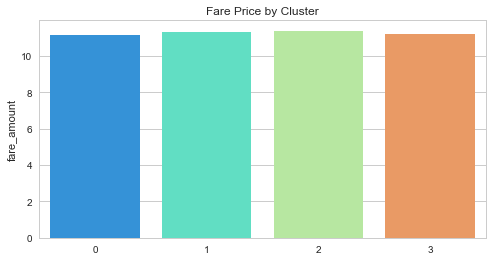

In [412]:
s = X_cluster.groupby(['clusters_all_set'], as_index=False).mean()['fare_amount']
g = sns.barplot(s.index, s, palette='rainbow')
g.figure.set_size_inches(8,4)
g.set_title("Fare Price by Cluster")

## Geoclustering

In [51]:

"""Cluster by 
time of day
day of week
location"""



X_locdf = taxi_train_data.copy()
X_loc = X_locdf[['pickup_longitude', 'pickup_latitude']]


#Show final feature count that goes into model
print('Location Feature Set has a shape of: {}'.format(X1.shape))



#Determine number of clusters using elbow plot
X_loc_norm = normalize(X_loc)

In [52]:



def elbow_curve(ModX):
    
    differences = []
    for k in range(1, 12):
        kmeans = KMeans(n_clusters=k)
        kmeans.fit(ModX)
        differences.append(kmeans.inertia_)

    plt.figure(figsize=(15, 5))
    plt.plot(range(1, 12), differences)
    plt.xticks(np.arange(0, 31, 1))
    plt.grid(True)
    plt.title('Clusters Elbow Curve')

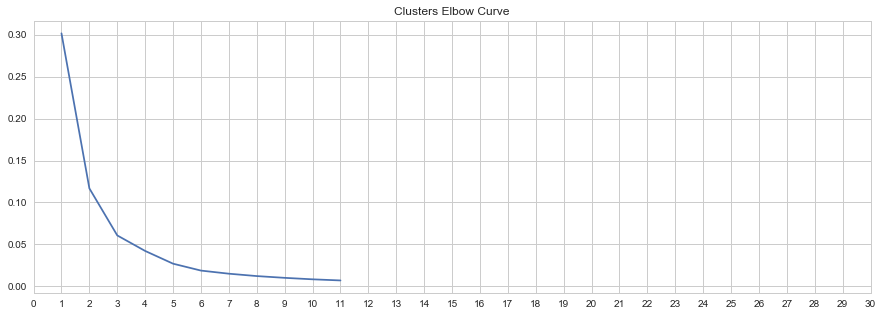

In [64]:

#Run on attendance
elbow_curve(X_loc_norm)

In [65]:
model = KMeans(n_clusters=6, random_state=42).fit(X_loc_norm)
labels = model.labels_
#print(metrics.silhouette_score(sample, labels, metric='euclidean'))

X_locdf['clusters_loc'] = labels

In [66]:

X_loc_clusters = X_locdf.groupby(['clusters_loc'], as_index=False).mean()
print(X_loc_clusters)

   clusters_loc  fare_amount  pickup_longitude  pickup_latitude  \
0             0        9.995           -73.959           40.779   
1             1       10.253           -73.994           40.731   
2             2       10.809           -73.971           40.760   
3             3       13.307           -74.004           40.706   
4             4       20.661           -73.909           40.790   
5             5       11.359           -73.979           40.745   

   dropoff_longitude  dropoff_latitude   hour  weekday  distance_traveled  
0            -73.966            40.767 13.459    2.985              0.029  
1            -73.983            40.739 12.855    3.300              0.030  
2            -73.972            40.757 14.044    2.892              0.032  
3            -73.984            40.729 13.508    3.100              0.042  
4            -73.956            40.767 13.927    2.966              0.071  
5            -73.977            40.748 13.549    2.991              0.034 

In [67]:
X_loc_clusters

,clusters_loc,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,hour,weekday,distance_traveled
0,0,9.995,-73.959,40.779,-73.966,40.767,13.459,2.985,0.029
1,1,10.253,-73.994,40.731,-73.983,40.739,12.855,3.300,0.030
2,2,10.809,-73.971,40.760,-73.972,40.757,14.044,2.892,0.032
3,3,13.307,-74.004,40.706,-73.984,40.729,13.508,3.100,0.042
4,4,20.661,-73.909,40.790,-73.956,40.767,13.927,2.966,0.071
5,5,11.359,-73.979,40.745,-73.977,40.748,13.549,2.991,0.034


In [68]:
import folium
#-74.5, -72.8, 40.5, 41.8
lat_center_nyc = 40.7128
lon_center_nyc = -74.0060

map_nyc_pk = folium.Map(location=[lat_center_nyc,lon_center_nyc],
                         tiles="OpenStreetMap",
                         max_zoom=15,zoom_start=15)


#plotting 2500 dta points
for i in range(0,len(X_loc_clusters)) :
    p = [X_loc_clusters["pickup_latitude"].values[i],
        X_loc_clusters["pickup_longitude"].values[i]]
    
    folium.Circle(location = p ,radius = 4,
                  color = "red").add_to(map_nyc_pk)
    

map_nyc_pk

In [ ]:
"""cluster_pred = KMeans(n_clusters=2, random_state=42).fit_predict(X)
X_pred = X.copy()
X_pred['cluster_assignment'] = cluster_pred

cluster_dataframes = {}
for n_clust in range(2):
    cluster_dataframes[n_clust] = X_pred.loc[X_pred['cluster_assignment'] == n_clust]

for name, frame in cluster_dataframes.items():
    print(name)
    print(frame.describe())"""

In [131]:
cluster_loc_1 = X_locdf.loc[lambda df: X_locdf['clusters_loc'] == 1, :]
cluster_loc_2 = X_locdf.loc[lambda df: X_locdf['clusters_loc'] == 2, :]
cluster_loc_3 = X_locdf.loc[lambda df: X_locdf['clusters_loc'] == 3, :]
cluster_loc_4 = X_locdf.loc[lambda df: X_locdf['clusters_loc'] == 4, :]
cluster_loc_5 = X_locdf.loc[lambda df: X_locdf['clusters_loc'] == 5, :]
cluster_loc_6 = X_locdf.loc[lambda df: X_locdf['clusters_loc'] == 6, :]

In [113]:
# this function will be used more often to plot data on the NYC map
def plot_on_map(df, BB, nyc_map, s=10, alpha=0.2):
    fig, axs = plt.subplots(1, 2, figsize=(16,10))
    axs[0].scatter(cluster_loc_4.pickup_longitude, cluster_loc_4.pickup_latitude, zorder=1, alpha=alpha, c='y', s=s)
    axs[0].set_xlim((BB[0], BB[1]))
    axs[0].set_ylim((BB[2], BB[3]))
    axs[0].set_title('Pickup locations')
    axs[0].imshow(nyc_map, zorder=0, extent=BB)

    axs[1].scatter(cluster_loc_4.dropoff_longitude, cluster_loc_4.dropoff_latitude, zorder=1, alpha=alpha, c='r', s=s)
    axs[1].set_xlim((BB[0], BB[1]))
    axs[1].set_ylim((BB[2], BB[3]))
    axs[1].set_title('Dropoff locations')
    axs[1].imshow(nyc_map, zorder=0, extent=BB)

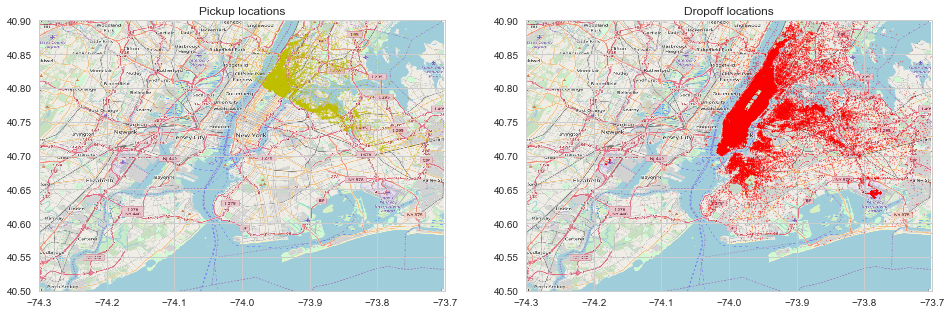

In [115]:
# plot training data on map zoomed in
plot_on_map(cluster_loc_4, BB_zoom, nyc_map_zoom, s=1, alpha=0.3)

In [118]:
cluster_loc_3 = X_locdf.loc[lambda df: X_locdf['clusters_loc'] == 3, :]

In [119]:
# this function will be used more often to plot data on the NYC map
def plot_on_map(df, BB, nyc_map, s=10, alpha=0.2):
    fig, axs = plt.subplots(1, 2, figsize=(16,10))
    axs[0].scatter(cluster_loc_3.pickup_longitude, cluster_loc_3.pickup_latitude, zorder=1, alpha=alpha, c='y', s=s)
    axs[0].set_xlim((BB[0], BB[1]))
    axs[0].set_ylim((BB[2], BB[3]))
    axs[0].set_title('Pickup locations')
    axs[0].imshow(nyc_map, zorder=0, extent=BB)

    axs[1].scatter(cluster_loc_3.dropoff_longitude, cluster_loc_3.dropoff_latitude, zorder=1, alpha=alpha, c='r', s=s)
    axs[1].set_xlim((BB[0], BB[1]))
    axs[1].set_ylim((BB[2], BB[3]))
    axs[1].set_title('Dropoff locations')
    axs[1].imshow(nyc_map, zorder=0, extent=BB)

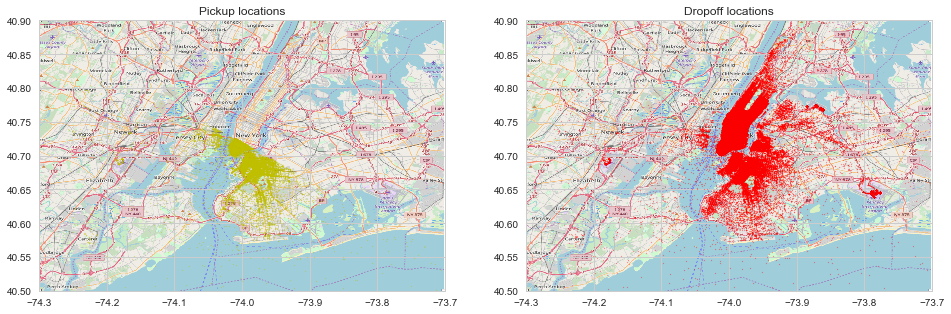

In [120]:
# plot training data on map zoomed in
plot_on_map(cluster_loc_3, BB_zoom, nyc_map_zoom, s=1, alpha=0.3)

In [121]:
# this function will be used more often to plot data on the NYC map
def plot_on_map(df, BB, nyc_map, s=10, alpha=0.2):
    fig, axs = plt.subplots(1, 2, figsize=(16,10))
    axs[0].scatter(cluster_loc_2.pickup_longitude, cluster_loc_2.pickup_latitude, zorder=1, alpha=alpha, c='y', s=s)
    axs[0].set_xlim((BB[0], BB[1]))
    axs[0].set_ylim((BB[2], BB[3]))
    axs[0].set_title('Pickup locations')
    axs[0].imshow(nyc_map, zorder=0, extent=BB)

    axs[1].scatter(cluster_loc_2.dropoff_longitude, cluster_loc_2.dropoff_latitude, zorder=1, alpha=alpha, c='r', s=s)
    axs[1].set_xlim((BB[0], BB[1]))
    axs[1].set_ylim((BB[2], BB[3]))
    axs[1].set_title('Dropoff locations')
    axs[1].imshow(nyc_map, zorder=0, extent=BB)

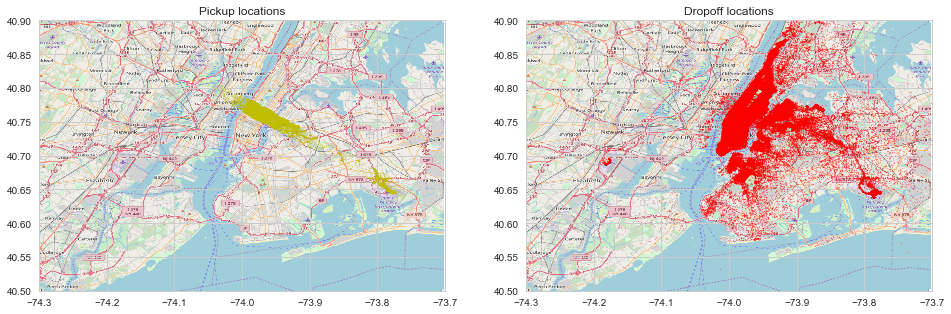

In [124]:
# plot training data on map zoomed in
plot_on_map(cluster_loc_2, BB_zoom, nyc_map_zoom, s=1, alpha=0.3)

In [125]:
# this function will be used more often to plot data on the NYC map
def plot_on_map(df, BB, nyc_map, s=10, alpha=0.2):
    fig, axs = plt.subplots(1, 2, figsize=(16,10))
    axs[0].scatter(cluster_loc_1.pickup_longitude, cluster_loc_1.pickup_latitude, zorder=1, alpha=alpha, c='y', s=s)
    axs[0].set_xlim((BB[0], BB[1]))
    axs[0].set_ylim((BB[2], BB[3]))
    axs[0].set_title('Pickup locations')
    axs[0].imshow(nyc_map, zorder=0, extent=BB)

    axs[1].scatter(cluster_loc_1.dropoff_longitude, cluster_loc_1.dropoff_latitude, zorder=1, alpha=alpha, c='r', s=s)
    axs[1].set_xlim((BB[0], BB[1]))
    axs[1].set_ylim((BB[2], BB[3]))
    axs[1].set_title('Dropoff locations')
    axs[1].imshow(nyc_map, zorder=0, extent=BB)

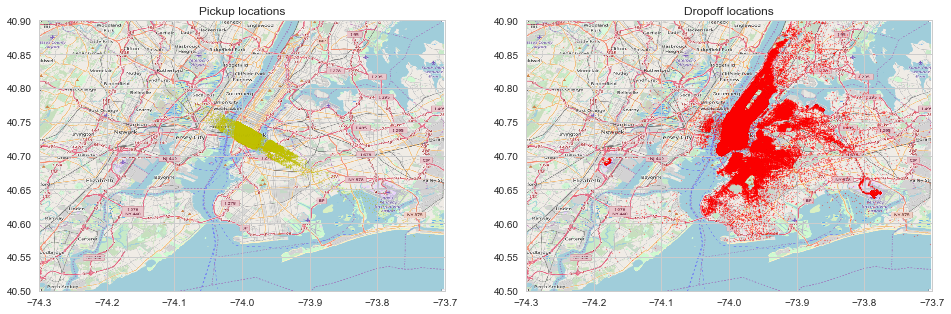

In [127]:
# plot training data on map zoomed in
plot_on_map(cluster_loc_1, BB_zoom, nyc_map_zoom, s=1, alpha=0.3)

In [128]:
# this function will be used more often to plot data on the NYC map
def plot_on_map(df, BB, nyc_map, s=10, alpha=0.2):
    fig, axs = plt.subplots(1, 2, figsize=(16,10))
    axs[0].scatter(cluster_loc_5.pickup_longitude, cluster_loc_5.pickup_latitude, zorder=1, alpha=alpha, c='y', s=s)
    axs[0].set_xlim((BB[0], BB[1]))
    axs[0].set_ylim((BB[2], BB[3]))
    axs[0].set_title('Pickup locations')
    axs[0].imshow(nyc_map, zorder=0, extent=BB)

    axs[1].scatter(cluster_loc_5.dropoff_longitude, cluster_loc_5.dropoff_latitude, zorder=1, alpha=alpha, c='r', s=s)
    axs[1].set_xlim((BB[0], BB[1]))
    axs[1].set_ylim((BB[2], BB[3]))
    axs[1].set_title('Dropoff locations')
    axs[1].imshow(nyc_map, zorder=0, extent=BB)

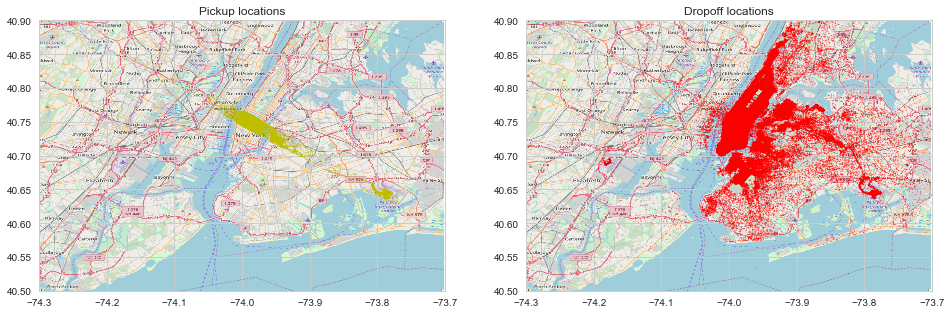

In [132]:
# plot training data on map zoomed in
plot_on_map(cluster_loc_5, BB_zoom, nyc_map_zoom, s=1, alpha=0.3)

Text(0.5,1,'Fare Price by Cluster')

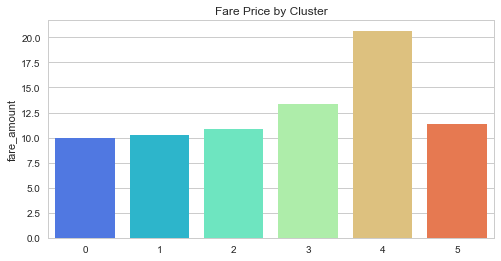

In [70]:
s = X_locdf.groupby(['clusters_loc'], as_index=False).mean()['fare_amount']
g = sns.barplot(s.index, s, palette='rainbow')
g.figure.set_size_inches(8,4)
g.set_title("Fare Price by Cluster")

##  Geo Clustering with DBSCAN

In [ ]:
from sklearn.cluster import DBSCAN

eps = [0.004, 0.005]   # unit: latitude/longitude
min_sample = [3, 4, 5]
n1, n2 = len(eps), len(min_sample)
plt.subplots(nrows=n1, ncols=n2, figsize=(20, 15))

for i in range(n1):
    for j in range(n2):
        est = DBSCAN(eps=eps[i], min_samples=min_sample[j], metric="euclidean").fit(X_loc)
        df_loc['cluster'] = est.labels_.tolist()

        ax = plt.subplot(n1, n2, n2*i+j+1)
        ax.set_title("DBSCAN ('euclidean', eps={}, min_sample={})".format(eps[i], min_sample[j]))
        
        plot_stations_map(ax, df_loc)

## Cluster by day of the week 

In [71]:

"""Cluster by 
time of day
day of week
location"""



X_daydf = taxi_train_data.copy()
X_day = X_daydf[["weekday"]]


#Show final feature count that goes into model
print('Location Feature Set has a shape of: {}'.format(X1.shape))



#Determine number of clusters using elbow plot
X_day_norm = normalize(X_day)

Location Feature Set has a shape of: (672035, 8)


In [ ]:
taxi_train_data.head(5)

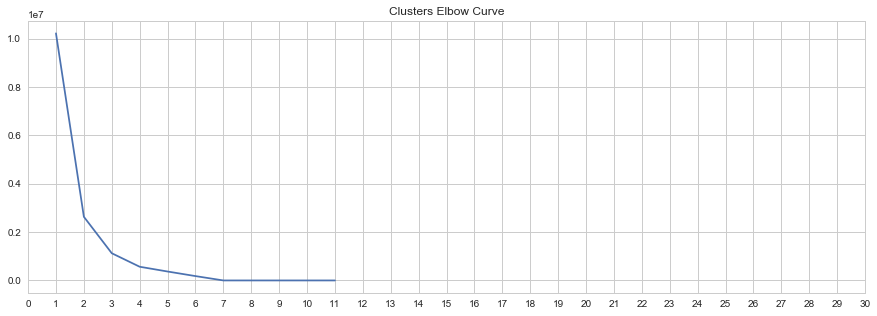

In [72]:

#Run on attendance
elbow_curve(X_day)

In [73]:
model = KMeans(n_clusters=7, random_state=42).fit(X_day)
labels = model.labels_
#print(metrics.silhouette_score(sample, labels, metric='euclidean'))

X_daydf['clusters_loc'] = labels

In [74]:

X_day_clusters = X_daydf.groupby(['clusters_loc'], as_index=False).mean()
print(X_day_clusters)

   clusters_loc  fare_amount  pickup_longitude  pickup_latitude  \
0             0       11.320           -73.976           40.751   
1             1       11.226           -73.976           40.752   
2             2       11.563           -73.975           40.749   
3             3       10.925           -73.978           40.749   
4             4       11.106           -73.975           40.752   
5             5       11.423           -73.976           40.751   
6             6       11.293           -73.973           40.752   

   dropoff_longitude  dropoff_latitude   hour  weekday  distance_traveled  
0            -73.975            40.751 13.638    4.000              0.033  
1            -73.975            40.752 13.943    2.000              0.033  
2            -73.973            40.750 11.944    6.000              0.037  
3            -73.976            40.750 13.045    5.000              0.033  
4            -73.975            40.752 14.064    1.000              0.033  
5      

In [75]:
X_day_clusters

,clusters_loc,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,hour,weekday,distance_traveled
0,0,11.320,-73.976,40.751,-73.975,40.751,13.638,4.000,0.033
1,1,11.226,-73.976,40.752,-73.975,40.752,13.943,2.000,0.033
2,2,11.563,-73.975,40.749,-73.973,40.750,11.944,6.000,0.037
3,3,10.925,-73.978,40.749,-73.976,40.750,13.045,5.000,0.033
4,4,11.106,-73.975,40.752,-73.975,40.752,14.064,1.000,0.033
5,5,11.423,-73.976,40.751,-73.975,40.752,13.959,3.000,0.034
6,6,11.293,-73.973,40.752,-73.974,40.752,13.902,0.000,0.035


Text(0.5,1,'Fare Price by Cluster')

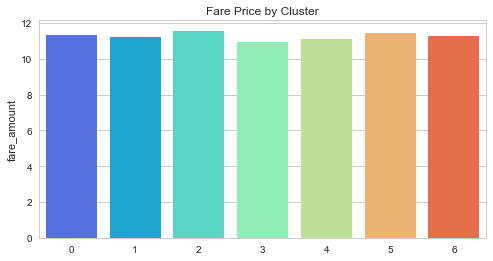

In [76]:
s = X_daydf.groupby(['clusters_loc'], as_index=False).mean()['fare_amount']
g = sns.barplot(s.index, s, palette='rainbow')
g.figure.set_size_inches(8,4)
g.set_title("Fare Price by Cluster")

In [ ]:
import folium
#-74.5, -72.8, 40.5, 41.8
lat_center_nyc = 40.7128
lon_center_nyc = -74.0060

map_nyc_pk = folium.Map(location=[lat_center_nyc,lon_center_nyc],
                         tiles="OpenStreetMap",
                         max_zoom=15,zoom_start=15)


#plotting 2500 dta points
for i in range(0,len(X_day_clusters)) :
    p = [X_daydf["pickup_latitude"].values[i],
        X_daydf["pickup_longitude"].values[i]]
    
    folium.Circle(location = p ,radius = 4,
                  color = "red").add_to(map_nyc_pk)
    

map_nyc_pk

In [77]:

"""Cluster by 
time of day
day of week
location"""



X_timedf = taxi_train_data.copy()
X_time = X_timedf[['hour']]


#Show final feature count that goes into model
print('Location Feature Set has a shape of: {}'.format(X1.shape))



#Determine number of clusters using elbow plot
X_time_norm = normalize(X_time)

Location Feature Set has a shape of: (672035, 8)


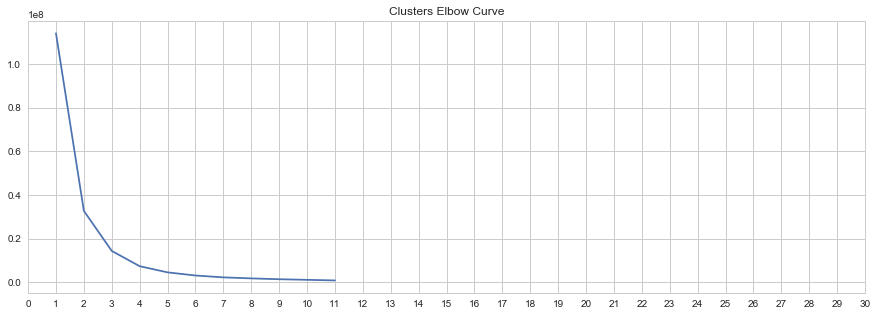

In [78]:

#Run on attendance
elbow_curve(X_time)

In [ ]:
from sklearn.cluster import MiniBatchKMeans
from sklearn.cluster import KMeans
n_clusters = (2,3, 4, 5,6,7, 10, 15, 20)
for n in n_clusters:
    print("Number of estimated clusters: {}".format(n))
    for sample in [X_time]:
        model = KMeans(n_clusters=n, random_state=42).fit(sample)
        labels = model.labels_
        print(metrics.silhouette_score(sample, labels, metric='euclidean', sample_size = 15000))

In [79]:
model = KMeans(n_clusters=3, random_state=42).fit(X_time)
labels = model.labels_
#print(metrics.silhouette_score(sample, labels, metric='euclidean'))

X_timedf['clusters_loc'] = labels

In [80]:

X_time_clusters = X_timedf.groupby(['clusters_loc'], as_index=False).mean()
print(X_time_clusters)

   clusters_loc  fare_amount  pickup_longitude  pickup_latitude  \
0             0       11.071           -73.976           40.750   
1             1       11.208           -73.974           40.754   
2             2       11.964           -73.979           40.744   

   dropoff_longitude  dropoff_latitude   hour  weekday  distance_traveled  
0            -73.976            40.751 19.586    2.964              0.033  
1            -73.975            40.753 11.172    2.866              0.032  
2            -73.969            40.746  2.291    3.760              0.041  


In [82]:
X_time_clusters

,clusters_loc,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,hour,weekday,distance_traveled
0,0,11.071,-73.976,40.750,-73.976,40.751,19.586,2.964,0.033
1,1,11.208,-73.974,40.754,-73.975,40.753,11.172,2.866,0.032
2,2,11.964,-73.979,40.744,-73.969,40.746,2.291,3.760,0.041


In [ ]:
import folium
#-74.5, -72.8, 40.5, 41.8
lat_center_nyc = 40.7128
lon_center_nyc = -74.0060

map_nyc_pk = folium.Map(location=[lat_center_nyc,lon_center_nyc],
                         tiles="OpenStreetMap",
                         max_zoom=15,zoom_start=15)


#plotting 2500 dta points
for i in range(0,len(X_time_clusters)) :
    p = [X_timedf["pickup_latitude"].values[i],
        X_timedf["pickup_longitude"].values[i]]
    
    folium.Circle(location = p ,radius = 4,
                  color = "red").add_to(map_nyc_pk)
    

map_nyc_pk

## Supervised Modeling on Each Cluster in Entire Dataset

In [147]:
y_train = taxi_train_data['fare_amount']
X_train = taxi_train_data.drop('fare_amount', axis=1)

In [148]:
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, random_state=42, test_size=0.40)

## Linear Regression

In [149]:
from sklearn import linear_model
# Instantiate and fit our model.# Instan 
regr = linear_model.LinearRegression()
regr.fit(X_train, y_train)

# Inspect the results.
print('\nCoefficients: \n', regr.coef_)
print('\nIntercept: \n', regr.intercept_)
print('\nR-squared:')
print(regr.score(X_train, y_train))


Coefficients: 
 [ 9.60201740e+00  5.49600177e+00 -6.87721580e+00 -1.55817763e+01
  9.78372589e-03 -3.74052417e-02  2.13639872e+02]

Intercept: 
 616.6042762819566

R-squared:
0.7829126582804036


## Huber Regression

In [150]:
from sklearn.linear_model import HuberRegressor
hr = HuberRegressor()

hr.fit(X_train, y_train)
print('coefficients: ' + str(hr.coef_))
print('intercept: ' + str(hr.intercept_))
print('score: ' + str(hr.score(X_train, y_train)))

coefficients: [-1.36168810e+00 -7.97144301e-01 -3.56983304e+00 -8.09427777e+00
  1.35825370e-02 -3.44902238e-02  2.17428023e+02]
intercept: 0.7764095650108962
score: 0.7772323164644124


In [298]:
Y_pred = hr.predict(X_test)

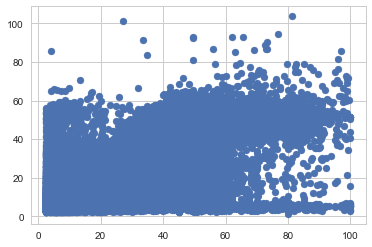

In [299]:
plt.scatter(y_test, Y_pred)
#plt.plot(y_train_5, X_train_5, color='red')
#sns.regplot(data_reduced['2005'],data_reduced['2015'])
plt.show()

## Validate Each Cluster!
Residual Vs. Predicted

### Cluster 0

In [358]:
y_train_clus0 = cluster_0['fare_amount']
X_train_clus0 = cluster_0.drop(['clusters_all_set', 'fare_amount'], axis=1)
X_train_0, X_test_0, y_train_0, y_test_0 = train_test_split(X_train_clus0, y_train_clus0, random_state=42, test_size=0.40)

In [359]:
from sklearn import linear_model
# Instantiate and fit our model.# Instan 
regr0 = linear_model.LinearRegression()
regr0.fit(X_train_0, y_train_0)

# Inspect the results.
print('\nCoefficients: \n', regr0.coef_)
print('\nIntercept: \n', regr0.intercept_)
print('\nR-squared:')
print(regr0.score(X_train_0, y_train_0))


Coefficients: 
 [ 5.52755990e+00  1.69989957e+00 -5.02526206e+00 -1.69095565e+01
 -7.34389796e-02 -2.77383540e-01  2.14687228e+02]

Intercept: 
 663.6704176882793

R-squared:
0.7923321262210814


In [360]:
from sklearn.linear_model import HuberRegressor
hr0 = HuberRegressor()

hr0.fit(X_train_0, y_train_0)
print('coefficients: ' + str(hr0.coef_))
print('intercept: ' + str(hr0.intercept_))
print('score: ' + str(hr0.score(X_train_0, y_train_0)))

coefficients: [ 3.64189059e+00 -3.43459434e+00 -9.99306344e+00 -7.98085456e+00
 -4.87870472e-02 -2.50775011e-01  2.19870519e+02]
intercept: 0.7844339127721257
score: 0.7878396350692736


In [361]:
Y0_pred = hr0.predict(X_test_0)

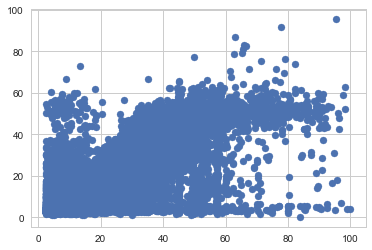

In [363]:
plt.scatter(y_test_0, Y0_pred)
#plt.plot(y_train_5, X_train_5, color='red')
#sns.regplot(data_reduced['2005'],data_reduced['2015'])
plt.show()

In [384]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_0, Y0_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test_0, Y0_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_0, Y0_pred)))  

Mean Absolute Error: 2.122676574723848
Mean Squared Error: 18.052407044703763
Root Mean Squared Error: 4.248812427573587


## Cluster 1

In [364]:
y_train_clus1 = cluster_1['fare_amount']
X_train_clus1 = cluster_1.drop(['clusters_all_set', 'fare_amount'], axis=1)
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X_train_clus1, y_train_clus1, random_state=42, test_size=0.40)

In [365]:
from sklearn import linear_model
# Instantiate and fit our model.# Instan 
regr1 = linear_model.LinearRegression()
regr1.fit(X_train_1, y_train_1)

# Inspect the results.
print('\nCoefficients: \n', regr1.coef_)
print('\nIntercept: \n', regr1.intercept_)
print('\nR-squared:')
print(regr1.score(X_train_1, y_train_1))


Coefficients: 
 [ 1.03393878e+01  6.17777299e+00 -7.05710410e+00 -1.23607581e+01
  1.51089895e-01  2.13843981e-01  2.17865120e+02]

Intercept: 
 497.2760909686066

R-squared:
0.794700108708758


In [366]:
from sklearn.linear_model import HuberRegressor
hr1 = HuberRegressor()

hr1.fit(X_train_1, y_train_1)
print('coefficients: ' + str(hr1.coef_))
print('intercept: ' + str(hr1.intercept_))
print('score: ' + str(hr1.score(X_train_1, y_train_1)))

coefficients: [ 7.81011848e-01  2.51402293e+00 -2.98644292e+00 -6.48841648e+00
  1.36754137e-01  1.88862513e-01  2.21606437e+02]
intercept: 0.7824476895960318
score: 0.7899351430017432


In [367]:
Y1_pred = hr1.predict(X_test_1)

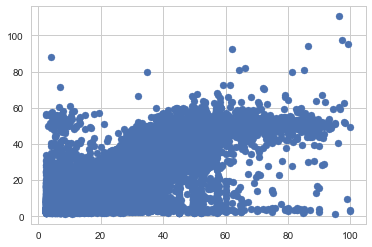

In [368]:
plt.scatter(y_test_1, Y1_pred)
#plt.plot(y_train_5, X_train_5, color='red')
#sns.regplot(data_reduced['2005'],data_reduced['2015'])
plt.show()

In [383]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_1, Y1_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test_1, Y1_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_1, Y1_pred)))  

Mean Absolute Error: 2.2385651480834574
Mean Squared Error: 19.556766736118995
Root Mean Squared Error: 4.422303329275254


### Cluster 2

In [369]:
y_train_clus2 = cluster_2['fare_amount']
X_train_clus2 = cluster_2.drop(['clusters_all_set', 'fare_amount'], axis=1)
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_train_clus2, y_train_clus2, random_state=42, test_size=0.40)

In [370]:
from sklearn import linear_model
# Instantiate and fit our model.# Instan 
regr2 = linear_model.LinearRegression()
regr2.fit(X_train_2, y_train_2)

# Inspect the results.
print('\nCoefficients: \n', regr2.coef_)
print('\nIntercept: \n', regr2.intercept_)
print('\nR-squared:')
print(regr2.score(X_train_2, y_train_2))


Coefficients: 
 [ 1.02789305e+01  3.03856369e+00 -8.07750018e+00 -1.66285881e+01
  8.92389889e-02 -1.81244917e-01  2.12955185e+02]

Intercept: 
 720.7982565550503

R-squared:
0.7702134766415761


In [371]:
from sklearn.linear_model import HuberRegressor
hr2 = HuberRegressor()

hr2.fit(X_train_2, y_train_2)
print('coefficients: ' + str(hr2.coef_))
print('intercept: ' + str(hr2.intercept_))
print('score: ' + str(hr2.score(X_train_2, y_train_2)))

coefficients: [ 1.56663293e+00  5.21503230e+00 -7.57968338e+00 -1.60673678e+01
  7.67218163e-02 -1.41530854e-01  2.15041486e+02]
intercept: 0.7969955201345273
score: 0.765368811859946


In [372]:
Y2_pred = hr2.predict(X_test_2)

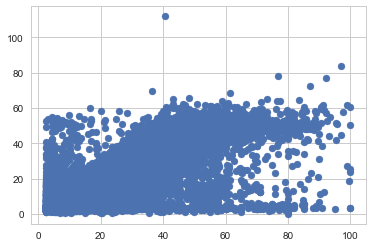

In [373]:


plt.scatter(y_test_2, Y2_pred)
#plt.plot(y_train_5, X_train_5, color='red')
#sns.regplot(data_reduced['2005'],data_reduced['2015'])
plt.show()

In [382]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_2, Y2_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test_2, Y2_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_2, Y2_pred)))  

Mean Absolute Error: 2.2003502939191173
Mean Squared Error: 20.042851661801866
Root Mean Squared Error: 4.476924352923764


### Cluster 3

In [374]:
y_train_clus3 = cluster_3['fare_amount']
X_train_clus3 = cluster_3.drop(['clusters_all_set', 'fare_amount'], axis=1)
X_train_3, X_test_3, y_train_3, y_test_3 = train_test_split(X_train_clus3, y_train_clus3, random_state=42, test_size=0.40)

In [375]:
from sklearn import linear_model
# Instantiate and fit our model.# Instan 
regr3 = linear_model.LinearRegression()
regr3.fit(X_train_3, y_train_3)

# Inspect the results.
print('\nCoefficients: \n', regr3.coef_)
print('\nIntercept: \n', regr3.intercept_)
print('\nR-squared:')
print(regr3.score(X_train_3, y_train_3))


Coefficients: 
 [ 8.17557820e+00  6.08116701e+00 -5.90743843e+00 -1.70578464e+01
 -1.79104646e-01  1.51108618e-01  2.14805239e+02]

Intercept: 
 622.2380266874217

R-squared:
0.7895476170080982


In [376]:
from sklearn.linear_model import HuberRegressor
hr3 = HuberRegressor()

hr3.fit(X_train_3, y_train_3)
hr3.fit(X_test_3, y_test_3)
print('coefficients: ' + str(hr3.coef_))
print('intercept: ' + str(hr3.intercept_))
print('score: ' + str(hr3.score(X_train_3, y_train_3)))

coefficients: [ 2.99693038e+00 -1.59617218e+00 -8.15299699e+00 -7.64011907e+00
 -1.42611068e-01  1.03583860e-01  2.19136333e+02]
intercept: 0.8032518016968703
score: 0.7847325141321126


In [377]:

Y3_pred = hr3.predict(X_test_3)

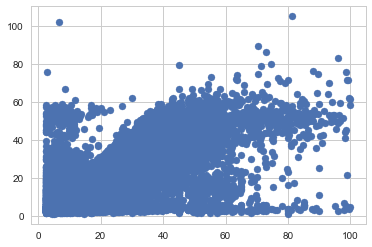

In [380]:


plt.scatter(y_test_3, Y3_pred)
#plt.plot(y_train_5, X_train_5, color='red')
#sns.regplot(data_reduced['2005'],data_reduced['2015'])
plt.show()

In [381]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_3, Y3_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test_3, Y3_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_3, Y3_pred)))  

Mean Absolute Error: 2.1179026813318957
Mean Squared Error: 18.654239055314434
Root Mean Squared Error: 4.319055342932576


### Cluster 4

In [285]:
y_train_clus4 = cluster_4['fare_amount']
X_train_clus4 = cluster_4.drop(['clusters_all_set', 'fare_amount'], axis=1)
X_train_4, X_test_4, y_train_4, y_test_4 = train_test_split(X_train_clus4, y_train_clus4, random_state=42, test_size=0.40)

In [286]:
from sklearn import linear_model
# Instantiate and fit our model.# Instan 
regr4 = linear_model.LinearRegression()
regr4.fit(X_train_4, y_train_4)

# Inspect the results.
print('\nCoefficients: \n', regr4.coef_)
print('\nIntercept: \n', regr4.intercept_)
print('\nR-squared:')
print(regr4.score(X_train_4, y_train_4))


Coefficients: 
 [ 1.02634426e+01  2.65811784e+00 -1.20906150e+00 -1.11636795e+01
  1.50258577e-01  1.49184414e-01  2.12307631e+02]

Intercept: 
 1019.162284414352

R-squared:
0.7103970587205162


In [287]:
from sklearn.linear_model import HuberRegressor
hr4 = HuberRegressor()

hr4.fit(X_train_4, y_train_4)
print('coefficients: ' + str(hr4.coef_))
print('intercept: ' + str(hr4.intercept_))
print('score: ' + str(hr4.score(X_train_4, y_train_4)))

coefficients: [ 5.64434541e-01  5.71265831e+00 -3.18045080e+00 -1.04300665e+01
  1.51211944e-01  1.82280388e-01  2.21019138e+02]
intercept: 0.6589368800838572
score: 0.7040366205569311


In [288]:
Y4_pred = hr4.predict(X_test_4)

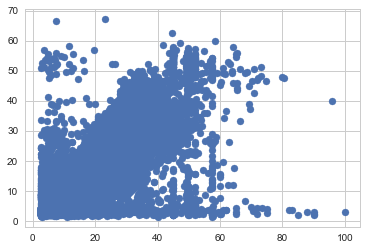

In [289]:


plt.scatter(y_test_4, Y4_pred)
#plt.plot(y_train_5, X_train_5, color='red')
#sns.regplot(data_reduced['2005'],data_reduced['2015'])
plt.show()

In [385]:
df_test = pd.DataFrame({'Actual': y_test_4, 'Predicted': Y4_pred})  
df_test['pct'] =  df_test['Predicted']/df_test['Actual']

In [387]:
df_test.describe()

,Actual,Predicted,pct
count,127085.000,127085.000,127085.000
mean,10.433,9.934,1.023
std,7.493,6.462,0.322
min,2.500,1.378,0.022
25%,5.700,6.053,0.864
50%,8.100,7.858,1.017
75%,12.000,11.217,1.171
max,100.000,67.079,20.323


In [348]:
from sklearn import metrics  
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_4, Y4_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test_4, Y4_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_4, Y4_pred)))  

Mean Absolute Error: 2.0788867273297273
Mean Squared Error: 16.1918665124431
Root Mean Squared Error: 4.023911842031719


### Cluster 5

In [225]:
y_train_clus5 = cluster_5['fare_amount']
X_train_clus5 = cluster_5.drop(['clusters_all_set', 'fare_amount'], axis=1)
X_train_5, X_test_5, y_train_5, y_test_5 = train_test_split(X_train_clus5, y_train_clus5, random_state=42, test_size=0.40)

In [226]:
from sklearn import linear_model
# Instantiate and fit our model.# Instan 
regr5 = linear_model.LinearRegression()
regr5.fit(X_train_5, y_train_5)

# Inspect the results.
print('\nCoefficients: \n', regr5.coef_)
print('\nIntercept: \n', regr5.intercept_)
print('\nR-squared:')
print(regr5.score(X_train_5, y_train_5))


Coefficients: 
 [ 6.10565980e+00  5.35834311e+00 -4.30092977e+00 -1.43888097e+01
 -1.50603006e-01  2.51685846e-01  2.10977095e+02]

Intercept: 
 508.1105596193383

R-squared:
0.6834980058837181


In [227]:
from sklearn.linear_model import HuberRegressor
hr5 = HuberRegressor()

hr5.fit(X_train_5, y_train_5)
print('coefficients: ' + str(hr5.coef_))
print('intercept: ' + str(hr5.intercept_))
print('score: ' + str(hr5.score(X_train_5, y_train_5)))

coefficients: [ 1.48168460e+00  8.11493539e+00 -4.20438924e+00 -1.29391778e+01
 -1.26036248e-01  2.09357266e-01  2.18562850e+02]
intercept: 0.6320513217979109
score: 0.6775028679036679


In [281]:
Y5_pred = hr5.predict(X_test_5)

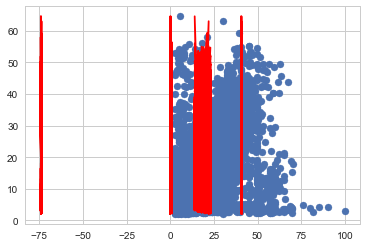

In [339]:


plt.scatter(y_test_5, Y5_pred)
plt.plot(X_test_5, Y5_pred, color='red')

plt.show()

In [350]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_5, Y5_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test_5, Y5_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_5, Y5_pred)))

Mean Absolute Error: 1.8965059278887175
Mean Squared Error: 14.332270309663368
Root Mean Squared Error: 3.7857985035740302


In [346]:
from scipy import stats

slope, intercept, r_value, p_value, std_err = stats.linregress(X_test_5,y_test_5)
line = slope*X_test_5+intercept

ValueError: all the input array dimensions except for the concatenation axis must match exactly

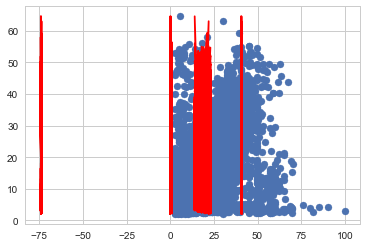

In [343]:
plt.scatter(y_test_5, Y5_pred)
plt.plot(X_test_5, Y5_pred, color='red')

plt.show()

In [341]:
min(Y5_pred)

2.06824274763097

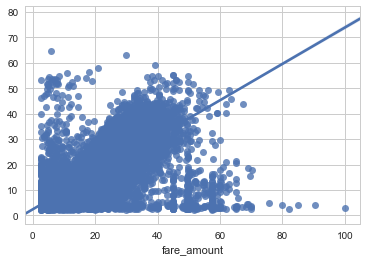

In [400]:
ax = sns.regplot(x=y_test_5, y=Y5_pred, ci=95)

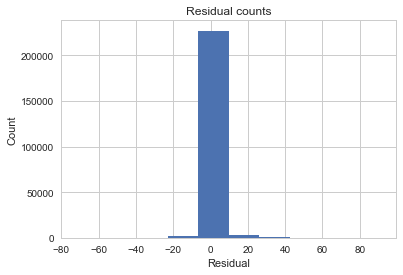

In [401]:
# Extract predicted values.
predicted = hr5.predict(X_train_5).ravel()
actual = y_train_5

# Calculate the error, also called the residual.
residual = actual - predicted

plt.hist(residual)
plt.title('Residual counts')
plt.xlabel('Residual')
plt.ylabel('Count')
plt.show()

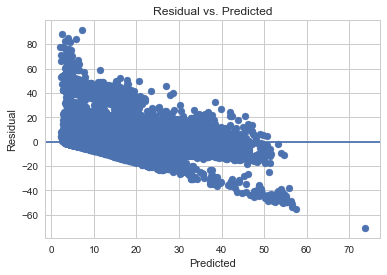

In [302]:
plt.scatter(predicted, residual)
plt.xlabel('Predicted')
plt.ylabel('Residual')
plt.axhline(y=0)
plt.title('Residual vs. Predicted')
plt.show()


In [395]:
import statsmodels.formula.api as smf
linear_formula = 'fare_amount ~ pickup_longitude+pickup_latitude+dropoff_longitude+dropoff_latitude+hour+weekday+distance_traveled'

# Fit the model to our data using the formula.
lm = smf.ols(formula=linear_formula, data=cluster_3).fit()

In [396]:
lm.params

Intercept           670.656
pickup_longitude      8.191
pickup_latitude       5.869
dropoff_longitude    -5.450
dropoff_latitude    -17.176
hour                 -0.178
weekday               0.152
distance_traveled   213.907
dtype: float64

In [411]:
lm.conf_int()

,0,1
Intercept,631.442,709.871
pickup_longitude,7.875,8.507
pickup_latitude,5.465,6.274
dropoff_longitude,-5.778,-5.123
dropoff_latitude,-17.520,-16.831
hour,-0.182,-0.175
weekday,0.143,0.160
distance_traveled,213.588,214.226


## Gradient Boosting

In [ ]:
"""from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
#start_time = time.time()
# We'll make 500 iterations, use 2-deep trees, and set our loss function.
params = {'n_estimators': 500,
          'random_state': 42,
          'max_depth': 2,
          'loss': 'huber'}
"""y_test2 = y_test.values.reshape(-1, 1)
X_test2 = X_test.values.reshape(-1, 1)
X_train2 = X_train.values.reshape(-1, 1)
y_train2 = y_train.values.reshape(-1, 1)"""

# Initialize and fit the model.
clf = ensemble.GradientBoostingRegressor(**params)
clf.fit(X_train, y_train)


clf_cv = cross_val_score(clf, X_train, y_train, cv=5)
#print("---Gradient Boosting Classifier %s seconds ---" % (time.time() - start_time))
#Test
y_true, y_pred = y_test, clf.predict(X_test)

print("Test Set score = {:.3} ".format(clf.score(y_true, y_pred)))


print("Training set Cross validation = {}".format(clf_cv))
print("mean = {:.3}".format(clf_cv.mean()))
print(pd.crosstab(y_true, y_pred))"""

In [ ]:
"""clf1 = ensemble.RandomForestRegressor()
cv1 = cross_val_score(clf1, X_train, y_train, cv=5)
print(cv1)
print("mean = {:.3}".format(cv1.mean()))"""

In [ ]:
"""clf1.fit(X_train, y_train)
y_true, y_pred = y_test, clf1.predict(X_test)

print("Test Set score = {:.3} ".format(clf1.score(y_true, y_pred)))"""

In [ ]:
"""params = {'n_estimators': 500,
          'random_state': 42,
          'max_depth': 2,
          'loss': 'huber'}
clf = ensemble.GradientBoostingRegressor(**params)
clf.fit(X_train, y_train)
clf_cv = cross_val_score(clf, X_train, y_train, cv=5)
print("Training set Cross validation = {}".format(clf_cv))
print("mean = {:.3}".format(clf_cv.mean()))"""

In [ ]:
"""GB_feature_importances = pd.DataFrame(clf.feature_importances_,
                                   index = X_train.columns,
                                    columns=['importance']).sort_values('importance', ascending=False)`"""

In [ ]:
""""
GB_feature_graph = GB_feature_importances['importance'].nlargest(10)
plt.xlabel('Relative importance', fontsize=15)
plt.ylabel('Feature', fontsize=15)
plt.title("GBM Feature Importance", fontsize=20)
GB_feature_graph.plot.barh()""""

## Random Forest Regressor

In [ ]:
"""from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(X_train, y_train)"""

In [ ]:
"""from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(X_train, y_train)
#rf_predict = rf.predict(X_test)
X_test_rf = X_test.reshape(-1, 1)
y_true, y_pred = y_test, rf.predict(X_test_rf)
print("Test Set score = {:.3} ".format(rf.score(y_true, y_pred)))
#print(rf_predict)"""

In [ ]:
"""from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
#start_time = time.time()

rfc1 = ensemble.RandomForestRegressor(random_state=42)
rfc1.fit(X_train,y_train)
cv1 = cross_val_score(rfc1, X_train, y_train, cv=5)

#print("---RFC takes %s seconds ---" % (time.time() - start_time))
#X_test1 = X_test1.reshape(-1, 1)
#Test
y_true, y_pred = y_test, rfc1.predict(X_test)
print("Test Set score = {:.3} ".format(rf.score(y_true, y_pred)))


print("Training set Cross validation = {}".format(cv1))
print("mean = {:.3}".format(cv1.mean()))
print(pd.crosstab(y_true, y_pred))
"""

In [ ]:
"""from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error as msq
import xgboost as xgb

stdscaler = StandardScaler()
xgb_train_X = stdscaler.fit_transform(train_X)
xgb_test_X  = stdscaler.fit_transform(test_X)

x_train, x_test, y_train, y_test = train_test_split(xgb_train_X, train_y, random_state=70, test_size=0.2)

def XGBmodel(x_train,x_test,y_train,y_test):
    matrix_train = xgb.DMatrix(x_train, label=y_train)
    matrix_test = xgb.DMatrix(x_test, label=y_test)
    model=xgb.train(params={'objective':'reg:linear','eval_metric':'rmse'},
                    dtrain=matrix_train,
                    num_boost_round=100, 
                    early_stopping_rounds=10,
                    evals=[(matrix_test,'test')])
    return model

xgb_model = XGBmodel(x_train,x_test,y_train,y_test)
xgb_pred = xgb_model.predict(xgb.DMatrix(xgb_test_X), ntree_limit = xgb_model.best_ntree_limit)"""

## Conclusions 

In [ ]:
Future apps